<a href="https://colab.research.google.com/github/jeanlsoto54/PRUEBA/blob/main/Rapi_group_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Load dataset

In [1]:
# Importing libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt



In [2]:
# Displaying at least 50 columns
pd.set_option('display.max_columns',50)

In [3]:
# Load data file
df = pd.read_csv('DETALLE ORDENES CANCELADAS_CL.csv')
df1 = pd.read_csv('DETALLE ORDENES CANCELADAS_EC.csv')
df2 = pd.read_csv('DETALLE ORDENES CANCELADAS_PE.csv')

In [ ]:
#Merging the datasets for the three countries Chile, Ecuador and Peru
merged_df = pd.concat([df, df1, df2], axis=0, ignore_index=True)
df = merged_df

It is being upleaded the dataset in 3 batches. each file contains the data of courier orders for the major cities of Perù, Chile and Ecuador

The dataset is composed from the next variables:

COUNTRY: Origin of the order (CL:chile,EC:ecuador,PE:peru)

MZ_NAME: microzone of a city defined by the company where it ,mostly all the time, the store and the user.

DATE_AGG: Date of the order

DIA_NOMBRE: label of the day when the order happened

REPURCHASE: Indicades, whether the order had no trackback (previous order for the same user the cancelled and
order again in about 1 hour)'With repurchase' or  not 'Without repurchase'

ORDER_ID: code of the order


USER_TOTAL_ORDERS: counting of how many orders the user previously did

% COMPLETED: % of the orders that were delivered to the client.

PAYMENT_METHOD: method to pay the order.

GMV_USD: net value of the order

ITEM_COUNT: number of items that compose the market basket

CITY:

BRAND_NAME:

STORE_ID:

LNG:

LAT

T03_PRE_PICKING_TIME: Lead time that is about between the order being set and that the clerk starts to pick up the products.

T04_PICKING_TIME: time that the clerk takes to gather all the items of the order

T05_CASHIER_TIME: Time take by the cahier to generate the bill

T06_REQUESTING_RT_TIME: Time that the clerk takes to ask for a courier to pick up the basket.

T07_WAITING_RT_TIME: interval of time between the requested call for a courier and the arrivel of it.

T08_CHECKOUT_TIME: Time that takes that the courier to put the basket on the vehicle

VEHICLE_TYPE: Type of vehicle thatthe couries has

MALL: Indicates if the the store is located on a shopping mall

SUB_VERTICAL: Classification defined by the company for the store  (Supermarket, pharmacy and so on)

DISTANCE_KM: Distance between the store and the user

TAG_GLOBAL_OFFER: Boolean that indicades if the order had a discount or not.

STOCKOUTS: number of Item (product id?) that were reported to be out of stock in the store.

TAG_BO: Boolean that indicates if the order was labeled as bad order.

TAG_BO_CANCEL: Indicades if the order was cancelled or not.

In [ ]:
df.tail()

,COUNTRY,MZ_NAME,DATE_AGG,DIA_NOMBRE,ORDER_ID,USER_TOTAL_ORDERS,% Completed orders user,PAYMENT_METHOD,GMV_USD,ITEM_COUNT,CITY,BRAND_GROUP,LAT,LNG,T04_PICKING_TIME,T05_CASHIER_TIME,T06_REQUESTING_RT_TIME,VEHICLE_TYPE,SUB_VERTICAL,STOCKOUTS,TAG_BO,TAG_CANCEL,DISTANCE_KM,USE_CREDIT,HORA,POLYGON_SIZE,RAPPI_AMOUNT
62377,PE,Microzona Bellavista,2023-07-01 00:00:00,sábado,2160362847,2,100.00 %,cash,3.852632,2.0,Lima,Oxxo,-12.068502,-77.115290,0.0,1.0,0.0,Motorcycle,Express,0,False,False,3.0,NaN,15,6.0,NaN
62378,PE,Jesús Maria - Lince LIM1,2023-07-01 00:00:00,sábado,2160362853,480,98.13 %,cc-DEBIT,7.550000,3.0,Lima,Oxxo,-12.109637,-77.046844,0.0,3.0,0.0,Motorcycle,Express,0,False,False,3.0,NaN,15,8.0,NaN
62379,PE,San Isidro Residencial LIM2,2023-07-01 00:00:00,sábado,2160362870,160,97.50 %,cc-credit,14.089474,1.0,Lima,La Boutique,-12.115765,-77.043421,7.0,0.0,0.0,Bicycle,Regalos,0,True,False,2.0,NaN,15,2.0,NaN
62380,PE,Chacarilla LIM2,2023-07-01 00:00:00,sábado,2160362902,1116,92.38 %,cc-credit,22.402632,3.0,Lima,Mifarma,-12.115089,-76.986207,10.0,6.0,NaN,Motorcycle,Farmacia,0,False,False,1.0,NaN,15,2.0,NaN
62381,PE,Miraflores Oeste LIM3,2023-07-01 00:00:00,sábado,2160362916,248,97.98 %,cc-credit,11.697368,5.0,Lima,Mifarma,-12.115012,-77.045736,5.0,3.0,NaN,Motorcycle,Farmacia,0,False,False,1.0,NaN,15,1.0,NaN


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62382 entries, 0 to 62381
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   COUNTRY                  62382 non-null  object 
 1   MZ_NAME                  62382 non-null  object 
 2   DATE_AGG                 62382 non-null  object 
 3   DIA_NOMBRE               62382 non-null  object 
 4   ORDER_ID                 62382 non-null  int64  
 5   USER_TOTAL_ORDERS        62382 non-null  int64  
 6   % Completed orders user  62382 non-null  object 
 7   PAYMENT_METHOD           62382 non-null  object 
 8   GMV_USD                  62382 non-null  float64
 9   ITEM_COUNT               61984 non-null  float64
 10  CITY                     62382 non-null  object 
 11  BRAND_GROUP              62382 non-null  object 
 12  LAT                      62380 non-null  float64
 13  LNG                      62380 non-null  float64
 14  T04_PICKING_TIME      

In [ ]:
df.isnull().sum()

COUNTRY                        0
MZ_NAME                        0
DATE_AGG                       0
DIA_NOMBRE                     0
ORDER_ID                       0
USER_TOTAL_ORDERS              0
% Completed orders user        0
PAYMENT_METHOD                 0
GMV_USD                        0
ITEM_COUNT                   398
CITY                           0
BRAND_GROUP                    0
LAT                            2
LNG                            2
T04_PICKING_TIME           11149
T05_CASHIER_TIME            1191
T06_REQUESTING_RT_TIME     30258
VEHICLE_TYPE                 994
SUB_VERTICAL                   0
STOCKOUTS                      0
TAG_BO                         0
TAG_CANCEL                     0
DISTANCE_KM                    2
USE_CREDIT                 54448
HORA                           0
POLYGON_SIZE                 226
RAPPI_AMOUNT               54448
dtype: int64

In [ ]:
df.describe()

,ORDER_ID,USER_TOTAL_ORDERS,GMV_USD,ITEM_COUNT,LAT,LNG,T04_PICKING_TIME,T05_CASHIER_TIME,T06_REQUESTING_RT_TIME,STOCKOUTS,DISTANCE_KM,HORA,POLYGON_SIZE,RAPPI_AMOUNT
count,6.238200e+04,62382.000000,62382.000000,61984.000000,62380.000000,62380.000000,51233.000000,61191.000000,32124.000000,62382.000000,62380.000000,62382.000000,62156.000000,7934.000000
mean,1.077458e+09,273.620564,25.612108,3.544786,-20.217390,-74.750681,8.044307,5.917324,0.239727,0.152095,2.690382,14.919913,4.814419,1234.730590
std,1.042297e+09,367.446864,26.668228,4.705169,11.763042,5.262204,40.483761,72.840315,6.635082,0.626426,1.496454,4.882335,2.678620,3155.284928
min,1.231984e+07,1.000000,0.000000,1.000000,-100.561920,-307.749219,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,8.846479e+07,28.000000,10.630000,1.000000,-33.419941,-77.041960,0.000000,0.000000,0.000000,0.000000,2.000000,12.000000,3.000000,12.000000
50%,8.859747e+07,138.000000,18.607895,2.000000,-12.128821,-76.978935,3.000000,1.000000,0.000000,0.000000,2.000000,15.000000,4.000000,14.950000
75%,2.160126e+09,386.000000,31.481481,4.000000,-12.084495,-70.595236,9.000000,4.000000,0.000000,0.000000,4.000000,19.000000,7.000000,32.000000
max,2.160363e+09,4274.000000,1230.214938,131.000000,-2.013953,-70.478749,5940.000000,14187.000000,1151.000000,38.000000,16.000000,88.000000,32.000000,57340.000000


# 2. Exploratory Data Analysis (EDA) (univariate / bivariate analysis)

# Translation of the dataset from Spanish to English

 + DIA_NOMBRE: Keep the name of the days when the order was

In [ ]:
# Checking unique values
df['DIA_NOMBRE'].unique()

array(['viernes', 'martes', 'miércoles', 'lunes', 'jueves', 'sábado',
       'domingo'], dtype=object)

In [ ]:
# Translating the Spanish values
trans = {'sábado': 'Saturday', 'lunes':'Monday', 'jueves':'Thursday', 'martes':'Tuesday', 'viernes':'Friday', 'miércoles':'Wednesday',
       'domingo':'Sunday'}
df['DIA_NOMBRE'] = df['DIA_NOMBRE'].map(trans)


In [ ]:
# Lower case of the columns
df.columns = df.columns.str.lower()

In [ ]:
# Checking the values
df['sub_vertical'].unique()

array(['Licores', 'Floristeria', 'Super', 'Express', 'Hogar',
       'Bebes y niños', 'Tecnologia', 'Mascotas', 'Sex shop', 'Deportes',
       'Farmacia', 'Belleza', 'Especializada', 'Smoking shop', 'Regalos',
       'Libreria', 'Moda', 'Papeleria', 'TurboX', 'Jugueteria', 'Marcas'],
      dtype=object)

The variable 'SUB_VERTICAL' contains the business sector to which is related the store. In this case, the labels are translated and compacted in fewer classes.

In [ ]:
# Translating the Spanish values
trans1 = {'Super' : 'Supermarket', 'Floristeria':'E-commerce', 'Express':'Convenient Store', 'Especializada': 'Special Convenient Store', 'Moda':'E-commerce',
       'Libreria':'E-commerce', 'Tecnologia':'E-commerce', 'Hogar':'E-commerce', 'Farmacia':'Pharmacie', 'Mascotas':'Pet Shop',
       'Smoking shop':'E-commerce', 'Belleza':'E-commerce', 'Regalos':'E-commerce', 'Licores':'Licours Shop', 'Deportes':'E-commerce',
       'Bebes y niños':'E-commerce', 'Jugueteria':'E-commerce', 'Sex shop':'E-commerce', 'TurboX':'E-commerce', 'Papeleria':'E-commerce',
       'Outlet':'E-commerce'}
df['sub_vertical'] = df['sub_vertical'].map(trans1)

In [ ]:
df = df.rename(columns={'sub_vertical':'store_category','mz_name':'district_name','date_agg':'date','dia_nombre':'weekday','gmv_usd':'order_value_usd','stockouts':'out_of_stock','tag_bo':'bad_order','tag_bo_cancel':'is_canceled' })

In [ ]:
df.head()

,country,district_name,date,weekday,order_id,user_total_orders,% completed orders user,payment_method,order_value_usd,item_count,city,brand_group,lat,lng,t04_picking_time,t05_cashier_time,t06_requesting_rt_time,vehicle_type,store_category,out_of_stock,bad_order,tag_cancel,distance_km,use_credit,hora,polygon_size,rappi_amount
0,CL,Campus Oriente SCL4,2023-06-30 00:00:00,Friday,88222630,111,95.50 %,rappi_pay_gateway,25.407407,2.0,Santiago de Chile,Botillería Echenique,-33.433491,-70.581792,NaN,14187.0,NaN,Bicycle,Licours Shop,0,False,False,2.0,NaN,23,NaN,NaN
1,CL,23 Senador Jaime Guzman,2023-06-27 00:00:00,Tuesday,88256140,4,50.00 %,cc-N/A,43.049383,1.0,Santiago de Chile,SOLOROSASYALGOMAS,-33.403637,-70.657823,2.0,0.0,NaN,Motorcycle,E-commerce,0,True,True,3.0,NaN,0,NaN,NaN
2,CL,Las Condes Poniente SCL3,2023-06-27 00:00:00,Tuesday,88287753,208,99.04 %,cc-credit,119.438889,11.0,Santiago de Chile,Jumbo,-33.402225,-70.598952,8.0,12.0,1.0,Motorcycle,Supermarket,0,False,False,4.0,NaN,12,NaN,NaN
3,CL,20 Pedro Fontova,2023-06-27 00:00:00,Tuesday,88290753,405,95.31 %,cc-N/A,13.061728,1.0,Santiago de Chile,Lider,-33.380700,-70.686793,NaN,0.0,NaN,NaN,Supermarket,0,True,True,2.0,NaN,13,NaN,NaN
4,CL,Campus Oriente SCL4,2023-06-27 00:00:00,Tuesday,88291146,455,96.92 %,cc-N/A,36.740741,3.0,Santiago de Chile,Jardineria teresa jacqueline huenun espinoza,-33.449619,-70.635816,NaN,0.0,NaN,Motorcycle,E-commerce,0,True,True,4.0,NaN,13,NaN,NaN


The variables ORDER_ID and DATE are being dropped since these data  is most useful in traceability than predictibility

In [ ]:
# Dropping unecessary columns
df.drop(['order_id','date'], axis= 1,inplace= True)

The data checked present a lot of variables with blank data. The next strategies are going to be implemented on the data:

+ Imputing the mean or mode value for the blank values: For the variables  'STORE_CATEGORY','VEHICLE_TYPE' Since, in this categories,the is an actual probability that the values are related to the median or mode.
+ Drop rows of the null values: 'LAT','LNG','POLYGON_SIZE'. The number of rows are low and can be dropped.
+ Put the fixed value 'FALSE' in 'USE_CREDIT': Since this is a boolean variable, and the blanks values mean False
+ Put the fixed value of 0: For the variables T04,T05,T06, and rappi_amount because these variabkes are time variables and currency, in which if they don't have value means that for that field, it doesn't apply the variable.
+ Finally, the variable % completed orders is in varchar and is going to be changed to decimal value

In [ ]:
# Checking null values
df.isnull().sum()

country                        0
district_name                  0
weekday                        0
user_total_orders              0
% completed orders user        0
payment_method                 0
order_value_usd                0
item_count                   398
city                           0
brand_group                    0
lat                            2
lng                            2
t04_picking_time           11149
t05_cashier_time            1191
t06_requesting_rt_time     30258
vehicle_type                 994
store_category               418
out_of_stock                   0
bad_order                      0
tag_cancel                     0
distance_km                    2
use_credit                 54448
hora                           0
polygon_size                 226
rappi_amount               54448
dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62382 entries, 0 to 62381
Data columns (total 25 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   country                  62382 non-null  object 
 1   district_name            62382 non-null  object 
 2   weekday                  62382 non-null  object 
 3   user_total_orders        62382 non-null  int64  
 4   % completed orders user  62382 non-null  object 
 5   payment_method           62382 non-null  object 
 6   order_value_usd          62382 non-null  float64
 7   item_count               61984 non-null  float64
 8   city                     62382 non-null  object 
 9   brand_group              62382 non-null  object 
 10  lat                      62380 non-null  float64
 11  lng                      62380 non-null  float64
 12  t04_picking_time         51233 non-null  float64
 13  t05_cashier_time         61191 non-null  float64
 14  t06_requesting_rt_time

In [ ]:
df[['vehicle_type', 'store_category', 'distance_km', 'out_of_stock']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62382 entries, 0 to 62381
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   vehicle_type    61388 non-null  object 
 1   store_category  61964 non-null  object 
 2   distance_km     62380 non-null  float64
 3   out_of_stock    62382 non-null  int64  
dtypes: float64(1), int64(1), object(2)
memory usage: 1.9+ MB


In [ ]:
# Removing % label
df['% completed orders user']=df['% completed orders user'].str.replace('%',' ')

df['% completed orders user']=df['% completed orders user'].astype('float')
df['% completed orders user']=df['% completed orders user']/100


In [ ]:
df[['% completed orders user']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62382 entries, 0 to 62381
Data columns (total 1 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   % completed orders user  62382 non-null  float64
dtypes: float64(1)
memory usage: 487.5 KB


In [ ]:
# Remove missing values
df.dropna(subset=['lat','lng','vehicle_type'],inplace=True)



In [ ]:
#Imputing values of mode and mean for the variables

mode_ps = df['polygon_size'].mode()[0]
df['polygon_size'].fillna(mode_ps, inplace=True)


In [ ]:
mean_ic = df['item_count'].mean()
df['item_count'].fillna(mean_ic, inplace=True)



In [ ]:
mode_sc = df['store_category'].mode()[0]
df['store_category'].fillna(mode_sc, inplace=True)


In [ ]:
# Replace missing values
df.fillna({'t04_picking_time': 0, 't05_cashier_time': 0, 't06_requesting_rt_time':0, 'rappi_amount':0}, inplace=True)

In [ ]:
# Replace missing values
df.fillna({'use_credit': False},inplace=True)

In [ ]:
zero_count = (df['order_value_usd'] == 0).sum()
print(zero_count)

28


In [ ]:
# Check duplicate values
dup_value = df.duplicated().sum()
print(dup_value)

0


In [ ]:

df.isnull().sum()

country                    0
district_name              0
weekday                    0
user_total_orders          0
% completed orders user    0
payment_method             0
order_value_usd            0
item_count                 0
city                       0
brand_group                0
lat                        0
lng                        0
t04_picking_time           0
t05_cashier_time           0
t06_requesting_rt_time     0
vehicle_type               0
store_category             0
out_of_stock               0
bad_order                  0
tag_cancel                 0
distance_km                0
use_credit                 0
hora                       0
polygon_size               0
rappi_amount               0
dtype: int64

In [ ]:
df.describe()

,user_total_orders,% completed orders user,order_value_usd,item_count,lat,lng,t04_picking_time,t05_cashier_time,t06_requesting_rt_time,out_of_stock,distance_km,hora,polygon_size,rappi_amount
count,61386.000000,61386.000000,61386.000000,61386.000000,61386.000000,61386.000000,61386.000000,61386.000000,61386.000000,61386.000000,61386.000000,61386.000000,61386.000000,61386.000000
mean,274.974261,0.961442,25.664790,3.555235,-20.215686,-74.750260,6.700355,5.883996,0.122748,0.151956,2.684586,14.930929,4.796794,155.762718
std,367.645345,0.082346,26.612041,4.692516,11.760945,5.256081,37.102066,72.709791,4.788191,0.625964,1.493528,4.853265,2.670743,1190.509515
min,1.000000,0.000000,0.000000,1.000000,-100.561920,-307.749219,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,28.000000,0.951200,10.678947,1.000000,-33.419950,-77.041960,0.000000,0.000000,0.000000,0.000000,2.000000,12.000000,3.000000,0.000000
50%,139.000000,0.972700,18.643356,2.000000,-12.128754,-76.979001,2.000000,1.000000,0.000000,0.000000,2.000000,15.000000,4.000000,0.000000
75%,388.000000,0.989300,31.572238,4.000000,-12.084663,-70.595183,7.000000,4.000000,0.000000,0.000000,4.000000,19.000000,7.000000,0.000000
max,4274.000000,4.000000,1230.214938,131.000000,-2.013953,-70.478749,5940.000000,14187.000000,1151.000000,38.000000,16.000000,88.000000,32.000000,57340.000000


In [ ]:
df.head()

,country,district_name,weekday,user_total_orders,% completed orders user,payment_method,order_value_usd,item_count,city,brand_group,lat,lng,t04_picking_time,t05_cashier_time,t06_requesting_rt_time,vehicle_type,store_category,out_of_stock,bad_order,tag_cancel,distance_km,use_credit,hora,polygon_size,rappi_amount
0,CL,Campus Oriente SCL4,Friday,111,0.9550,rappi_pay_gateway,25.407407,2.0,Santiago de Chile,Botillería Echenique,-33.433491,-70.581792,0.0,14187.0,0.0,Bicycle,Licours Shop,0,False,False,2.0,False,23,3.0,0.0
1,CL,23 Senador Jaime Guzman,Tuesday,4,0.5000,cc-N/A,43.049383,1.0,Santiago de Chile,SOLOROSASYALGOMAS,-33.403637,-70.657823,2.0,0.0,0.0,Motorcycle,E-commerce,0,True,True,3.0,False,0,3.0,0.0
2,CL,Las Condes Poniente SCL3,Tuesday,208,0.9904,cc-credit,119.438889,11.0,Santiago de Chile,Jumbo,-33.402225,-70.598952,8.0,12.0,1.0,Motorcycle,Supermarket,0,False,False,4.0,False,12,3.0,0.0
4,CL,Campus Oriente SCL4,Tuesday,455,0.9692,cc-N/A,36.740741,3.0,Santiago de Chile,Jardineria teresa jacqueline huenun espinoza,-33.449619,-70.635816,0.0,0.0,0.0,Motorcycle,E-commerce,0,True,True,4.0,False,13,3.0,0.0
6,CL,Jardin de la Dehesa SCL2,Wednesday,9,0.0000,cash,20.835802,6.0,Santiago de Chile,Lider,-33.371366,-70.513265,16.0,5.0,0.0,Bicycle,Supermarket,0,True,True,1.0,False,19,3.0,0.0


In [ ]:
# Removing negative values
negative_cols = ['user_total_orders', 'item_count', 't04_picking_time', 't05_cashier_time', 't06_requesting_rt_time',
                 'out_of_stock', 'distance_km', 'hora', 'polygon_size', 'rappi_amount']

# Create a mask that identifies rows with any negative value in the specified columns
negative_mask = df[negative_cols].lt(0).any(axis=1)

# Use the mask to filter out rows with negative values
df1 = df[~negative_mask]

In [ ]:
# Separating quantiative & Categorical variables
df_cat = df.select_dtypes(include=['object','bool'])
df_quan = df.select_dtypes(exclude=['object','bool'])

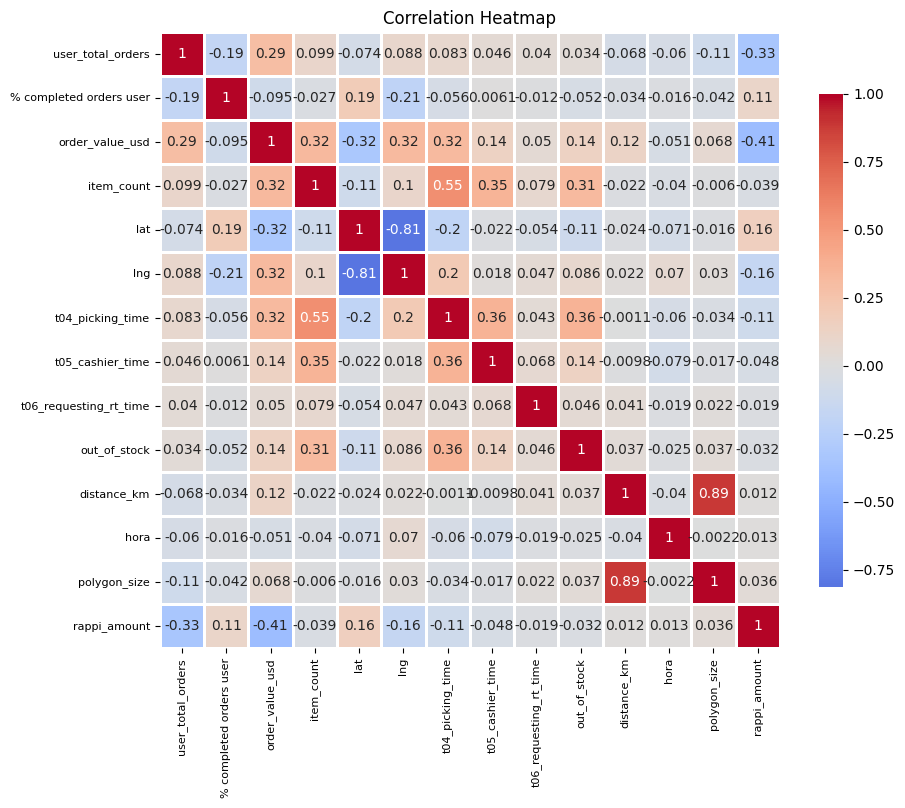

In [ ]:
# Create a heatmap
plt.figure(figsize=(10, 8))
df_quan_corr = df_quan.corr(method = 'spearman' )
ax = sns.heatmap(df_quan_corr, annot=True, cmap='coolwarm', center=0,fmt='.2g',xticklabels='auto', yticklabels='auto',linewidth=.8,cbar_kws={"shrink": .8})
ax.tick_params(axis='both', which='both', labelsize=8)
plt.title("Correlation Heatmap")
plt.show()

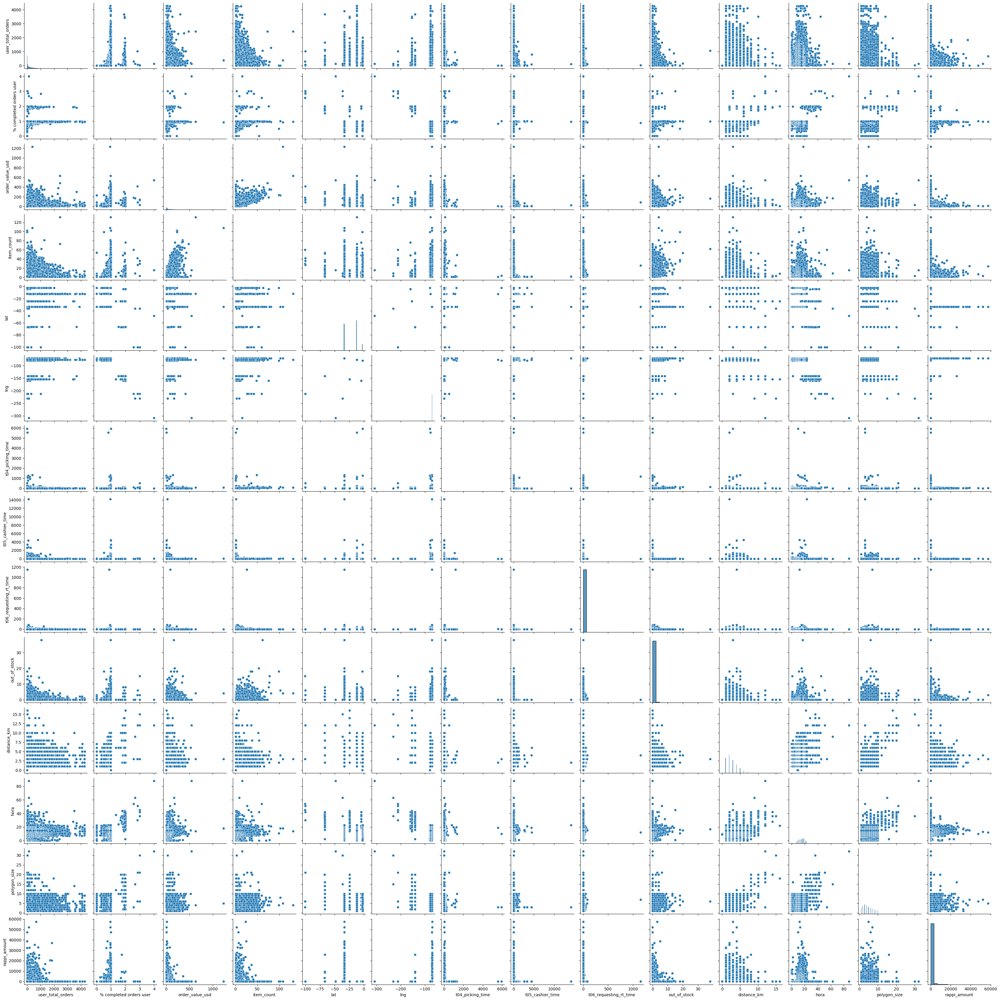

In [ ]:
# Create a pairplot
sns.pairplot(df_quan)

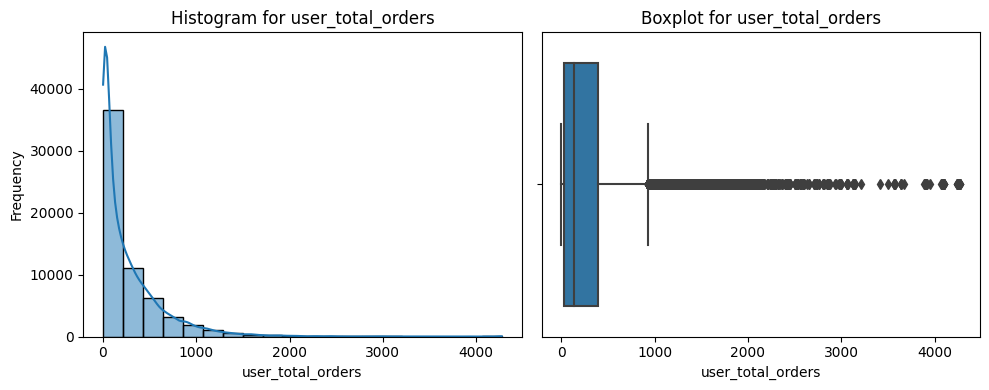

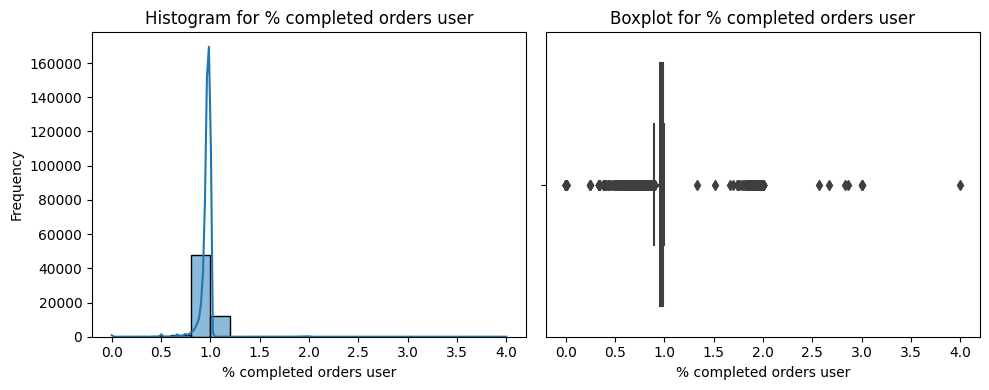

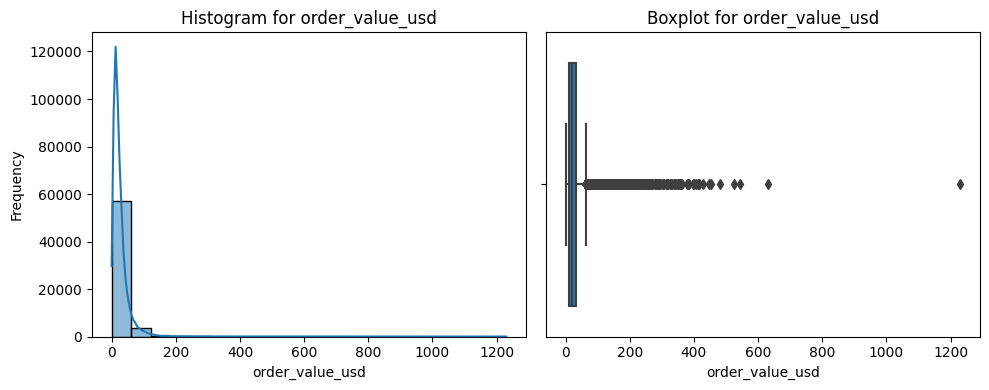

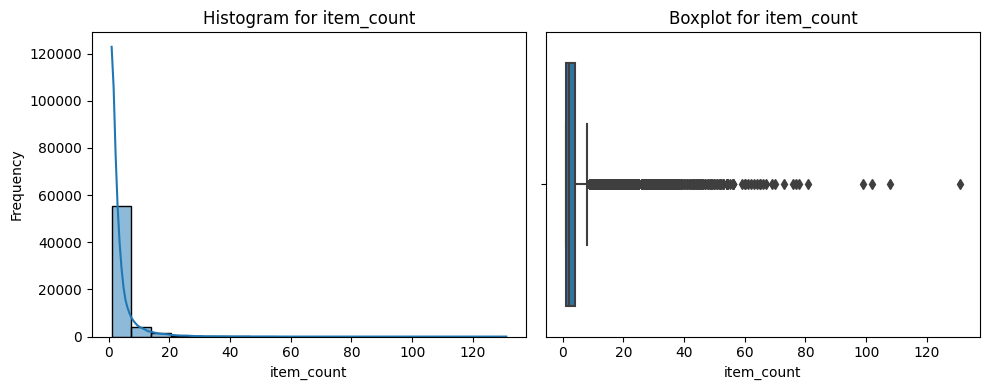

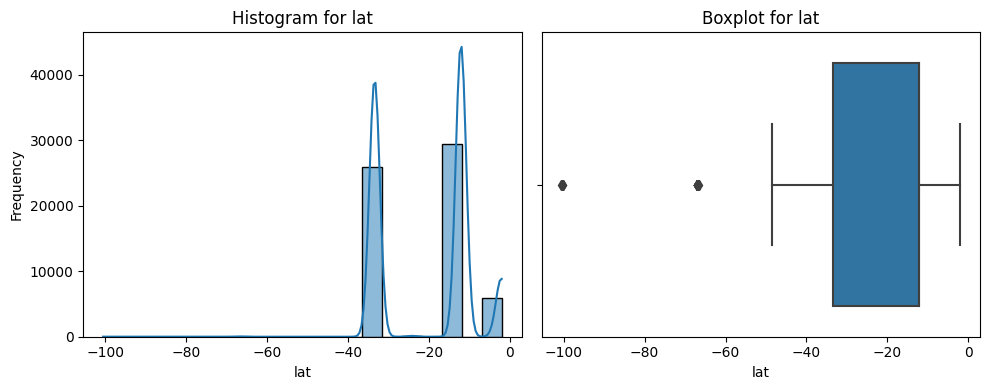

...

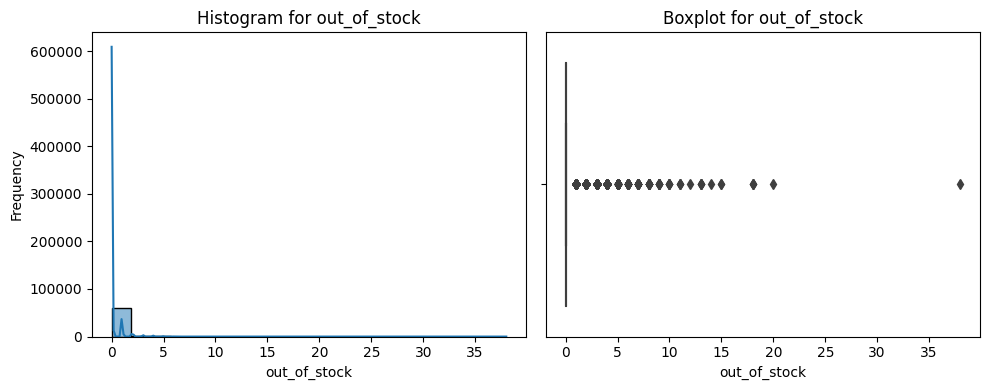

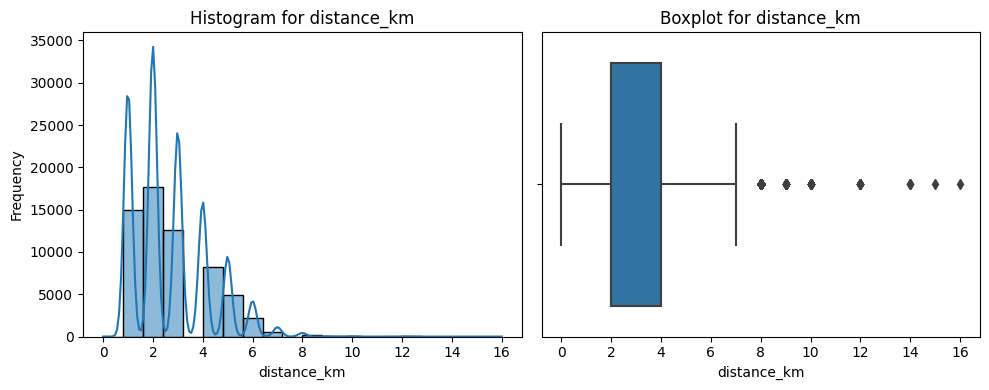

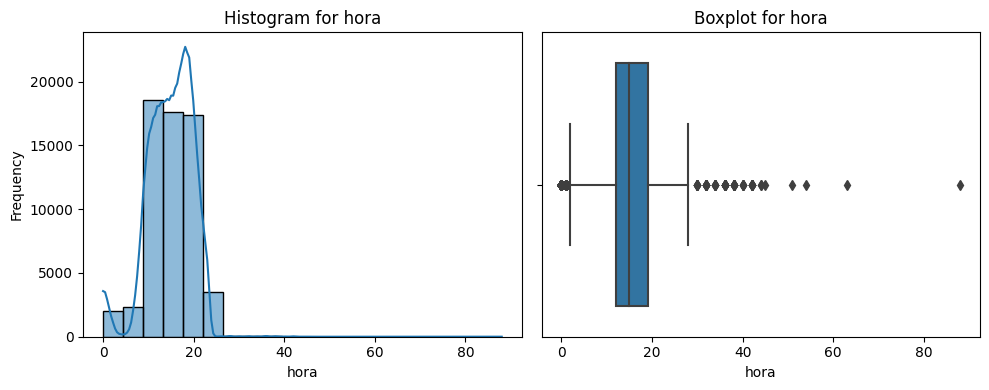

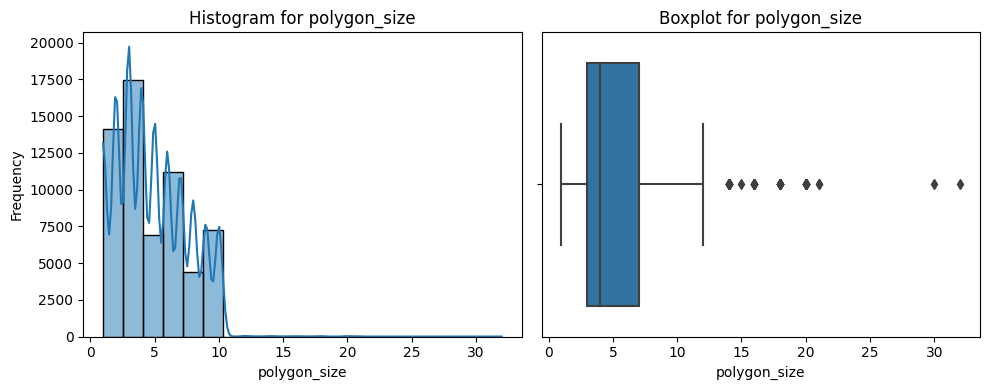

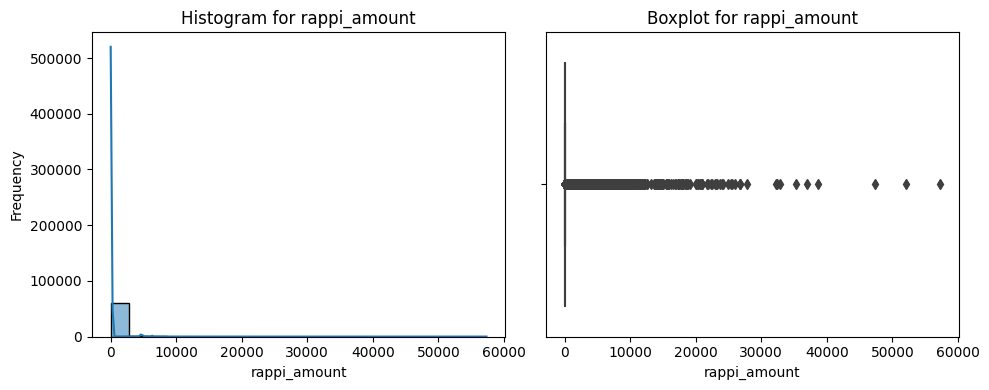

In [ ]:
for col in df_quan.columns:
    fig, ax = plt.subplots(1, 2, figsize=(10, 4))

    # Histogram
    sns.histplot(df_quan[col], kde=True, bins=20, ax=ax[0])
    ax[0].set_title(f'Histogram for {col}')
    ax[0].set_xlabel(col)
    ax[0].set_ylabel('Frequency')

    # Box plot
    sns.boxplot(x=df_quan[col], ax=ax[1])
    ax[1].set_title(f'Boxplot for {col}')
    ax[1].set_xlabel(col)

    plt.tight_layout()
    plt.show()

In [ ]:
df_quan.columns

Index(['user_total_orders', '% completed orders user', 'order_value_usd',
       'item_count', 'lat', 'lng', 't04_picking_time', 't05_cashier_time',
       't06_requesting_rt_time', 'out_of_stock', 'distance_km', 'hora',
       'polygon_size', 'rappi_amount'],
      dtype='object')

In [ ]:
#Removing outliers for : % completed orders user, picking_time, cashier_time, t_06, polygon size, rapi_amount
columns = ['t04_picking_time', 't05_cashier_time',
           't06_requesting_rt_time', 'polygon_size', 'rappi_amount']

Q1 = df[columns].quantile(0.25)
Q3 = df[columns].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = pd.DataFrame()
for col in columns:
    condition = (df[col] < lower_bound[col]) | (df[col] > upper_bound[col])
    outliers = outliers.append(df[condition], ignore_index=True)


<ipython-input-22-a77d806d33c3>:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[condition], ignore_index=True)


In [ ]:
#chi_squared for categorical
from scipy.stats import chi2_contingency

chi_squared_results = pd.DataFrame(columns=['Variable 1', 'Variable 2', 'Chi-Squared', 'P-Value'])

for var1 in df_cat:
    for var2 in df_cat:
        if var1 != var2:
          #if var2 =='bad_order':
            contingency_table = pd.crosstab(df[var1], df[var2])

            chi2, p, _, _ = chi2_contingency(contingency_table)


            new_row = pd.DataFrame({'Variable 1': [var1], 'Variable 2': [var2], 'Chi-Squared': [chi2], 'P-Value': [p]})

            chi_squared_results = pd.concat([chi_squared_results, new_row], ignore_index=True)

chi_squared_results


,Variable 1,Variable 2,Chi-Squared,P-Value
0,country,district_name,122772.000000,0.000000e+00
1,country,weekday,6388.912578,0.000000e+00
2,country,payment_method,5699.398258,0.000000e+00
3,country,city,122772.000000,0.000000e+00
4,country,brand_group,107408.463081,0.000000e+00
...,...,...,...,...
105,use_credit,brand_group,9318.591443,0.000000e+00
106,use_credit,vehicle_type,253.875937,7.439447e-56
107,use_credit,store_category,1779.554616,0.000000e+00
108,use_credit,bad_order,44.885613,2.088870e-11


In [ ]:
#Checking for independance between our outcome bad_order and the categorical variables

In [ ]:
#chi_squared for categorical
from scipy.stats import chi2_contingency

chi_squared_results = pd.DataFrame(columns=['Variable', 'Chi-Squared', 'P-Value'])

outcome_variable = 'bad_order'

for var in df_cat:
        if var != outcome_variable:
            contingency_table = pd.crosstab(df[outcome_variable], df[var])

            chi2, p, _, _ = chi2_contingency(contingency_table)


            new_row = pd.DataFrame({'Variable': var, 'Chi-Squared': [chi2], 'P-Value': [p]})

            chi_squared_results = pd.concat([chi_squared_results, new_row], ignore_index=True)

            if p < 0.05:
              print(f"There is a significant association between {outcome_variable} and {var} (p-value = {p:.2f})")
            else:
              print(f"There is no significant association between {outcome_variable} and {var} (p-value = {p:.2f})")

#H0 there is no relathionship between the variables

chi_squared_results


There is a significant association between bad_order and country (p-value = 0.00)
There is a significant association between bad_order and district_name (p-value = 0.00)
There is a significant association between bad_order and weekday (p-value = 0.00)
There is a significant association between bad_order and payment_method (p-value = 0.00)
There is a significant association between bad_order and city (p-value = 0.00)
There is a significant association between bad_order and brand_group (p-value = 0.00)
There is a significant association between bad_order and vehicle_type (p-value = 0.00)
There is a significant association between bad_order and store_category (p-value = 0.00)
There is a significant association between bad_order and tag_cancel (p-value = 0.00)
There is a significant association between bad_order and use_credit (p-value = 0.00)


,Variable,Chi-Squared,P-Value
0,country,407.663958,2.998446e-89
1,district_name,1486.157670,2.944797e-235
2,weekday,185.120500,2.772021e-37
3,payment_method,884.045564,1.693564e-184
4,city,407.663958,2.998446e-89
5,brand_group,2991.690427,4.625567e-171
6,vehicle_type,290.719774,7.430245e-64
7,store_category,338.667335,4.177425e-70
8,tag_cancel,17560.336627,0.000000e+00
9,use_credit,44.885613,2.088870e-11


In [ ]:
#Perfoming ANOVA TEST for mixed categorical and numerical values

In [ ]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm

# List of numerical variables for the ANOVA tests
df_quan = ['% completed orders user', 'order_value_usd', 'item_count', 't04_picking_time', 't05_cashier_time', 't06_requesting_rt_time', 'out_of_stock', 'distance_km', 'hora']

# Perform ANOVA for numerical variables
for num_var in df_quan:
    formula = f'{num_var} ~ C(bad_order)'
    try:
        model = ols(formula, data=df).fit()
        anova_table = anova_lm(model)
        print(f"ANOVA table for {num_var} and bad_order:")
        print(anova_table)

        p_value = anova_table['PR(>F)'][0]
        if p_value < 0.05:
            print(f"There is a significant difference between the means of the groups defined by bad_order for {num_var} (p-value = {p_value:.2f})")
        else:
            print(f"There is no difference between the means of k groups")

        print("=" * 40)

    except Exception as e:
        print(f"Error for {num_var} and bad_order: {str(e)}")



Error for % completed orders user and bad_order: 
ANOVA table for order_value_usd and bad_order:
                   df        sum_sq        mean_sq           F        PR(>F)
C(bad_order)      1.0  1.405410e+05  140540.961743  199.088314  3.885452e-45
Residual      61384.0  4.333236e+07     705.922709         NaN           NaN
There is a significant difference between the means of the groups defined by bad_order for order_value_usd (p-value = 0.00)
ANOVA table for item_count and bad_order:
                   df        sum_sq       mean_sq           F         PR(>F)
C(bad_order)      1.0  1.773998e+04  17739.983216  816.342056  2.240246e-178
Residual      61384.0  1.333940e+06     21.731066         NaN            NaN
There is a significant difference between the means of the groups defined by bad_order for item_count (p-value = 0.00)
ANOVA table for t04_picking_time and bad_order:
                   df        sum_sq        mean_sq           F        PR(>F)
C(bad_order)      1.0  2.272759

#

# 4. Machine Learning


In [ ]:
# Feature engineering
df_quan

,user_total_orders,% completed orders user,order_value_usd,item_count,lat,lng,t04_picking_time,t05_cashier_time,t06_requesting_rt_time,out_of_stock,distance_km,hora,polygon_size,rappi_amount
0,111,0.9550,25.407407,2.0,-33.433491,-70.581792,0.0,14187.0,0.0,0,2.0,23,3.0,0.0
1,4,0.5000,43.049383,1.0,-33.403637,-70.657823,2.0,0.0,0.0,0,3.0,0,3.0,0.0
2,208,0.9904,119.438889,11.0,-33.402225,-70.598952,8.0,12.0,1.0,0,4.0,12,3.0,0.0
4,455,0.9692,36.740741,3.0,-33.449619,-70.635816,0.0,0.0,0.0,0,4.0,13,3.0,0.0
6,9,0.0000,20.835802,6.0,-33.371366,-70.513265,16.0,5.0,0.0,0,1.0,19,3.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62377,2,1.0000,3.852632,2.0,-12.068502,-77.115290,0.0,1.0,0.0,0,3.0,15,6.0,0.0
62378,480,0.9813,7.550000,3.0,-12.109637,-77.046844,0.0,3.0,0.0,0,3.0,15,8.0,0.0
62379,160,0.9750,14.089474,1.0,-12.115765,-77.043421,7.0,0.0,0.0,0,2.0,15,2.0,0.0
62380,1116,0.9238,22.402632,3.0,-12.115089,-76.986207,10.0,6.0,0.0,0,1.0,15,2.0,0.0


For this part we are going to start put the data in a standarization and onehot encoding so the data is ready to be inserted in the modeling. For it, we are going to use the Pipeline method

In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin

class VariableSelector(BaseEstimator, TransformerMixin):
    def __init__(self,attribute_names):
        self.attribute_names = attribute_names

    def fit(self, X , y=None):
        return self

    def transform(self, X):
        return X[self.attribute_names]

In [ ]:
columns_quan = list(df_quan.columns)

In [ ]:
columns_quan


['user_total_orders',
 '% completed orders user',
 'order_value_usd',
 'item_count',
 'lat',
 'lng',
 't04_picking_time',
 't05_cashier_time',
 't06_requesting_rt_time',
 'out_of_stock',
 'distance_km',
 'hora',
 'polygon_size',
 'rappi_amount']

In [ ]:
#quantitative
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

quanti_pipeline = Pipeline(
    [
     ('selector', VariableSelector(columns_quan)),
     ('std_scaler', StandardScaler())
    ]
    )



In [ ]:
#It is being checked in the case of the categorical variables, which values can be apprved for a OHE method or label encoding

df_cat_oh = ['country','payment_method','city','vehicle_type','store_category','use_credit']
df_cat_le = ['district_name','brand_group']



In [ ]:
from sklearn.preprocessing import OneHotEncoder as OHE

cuali_pipeline_ohe = Pipeline(

  [
    ('selector',VariableSelector(df_cat_oh)),
    ('OHE_columns',OHE(sparse=False))

  ]

)

In [ ]:
from sklearn.preprocessing import OrdinalEncoder as OE

cuali_pipeline_le =Pipeline(

                            [
                             ('selector',VariableSelector(df_cat_le)),
                             ('LE_columns', OE())
                            ]

)

In [ ]:
from sklearn.pipeline import FeatureUnion

full_pipeline =FeatureUnion(
    transformer_list=[
        ('num_pipeline', quanti_pipeline),
        ('ohe_pipeline',cuali_pipeline_ohe),
        ('le_pipeline',cuali_pipeline_le)
                      ]
)

Once that is defined the Pipeline, to do the adjustements on the data. It is going to be retrieved from the main dataset the y to be predicted


In [ ]:
x_df = full_pipeline.fit_transform(df)


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [ ]:
X = x_df
y = df['bad_order']

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size=0.2,random_state=42,shuffle=True,stratify = y)

Now that we splited our data, we will apply 3 models on our categorical outcome (Logistic regression, Classification Tree, Random Forest)

+ LOGISTICS REGRESSION

In [ ]:
#Logistic Regression Model Fitting

from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(penalty = None, solver = 'newton-cholesky')
logreg.fit(X_train, y_train)

#Predicting the test set results
lr_pred = logreg.predict(X_test)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_glm/_newton_solver.py:491: LinAlgWarning: The inner solver of NewtonCholeskySolver stumbled upon a singular or very ill-conditioned Hessian matrix at iteration #1. It will now resort to lbfgs instead.
Further options are to use another solver or to avoid such situation in the first place. Possible remedies are removing collinear features of X or increasing the penalization strengths.
The original Linear Algebra message was:
Ill-conditioned matrix (rcond=1.87518e-25): result may not be accurate.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_glm/_newton_solver.py:195: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)


In [ ]:
#Calculating the accuracy
print('Accuracy of Logistic Regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

Accuracy of Logistic Regression classifier on test set: 0.92


In [ ]:
#Checking crossvalidated performance
from sklearn.model_selection import cross_val_score
cv_score = cross_val_score(logreg, X_test, y_test)
print(f"average cross validated score : {np.mean(cv_score)}")

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_glm/_newton_solver.py:491: LinAlgWarning: The inner solver of NewtonCholeskySolver stumbled upon a singular or very ill-conditioned Hessian matrix at iteration #1. It will now resort to lbfgs instead.
Further options are to use another solver or to avoid such situation in the first place. Possible remedies are removing collinear features of X or increasing the penalization strengths.
The original Linear Algebra message was:
Ill-conditioned matrix (rcond=9.72125e-27): result may not be accurate.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_glm/_newton_solver.py:195: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/usr/local/lib/python3.10/dist-p

average cross validated score : 0.9181462414669259


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_glm/_newton_solver.py:195: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_glm/_newton_solver.py:491: LinAlgWarning: The inner solver of NewtonCholeskySolver stumbled upon a singular or very ill-conditioned Hessian matrix at iteration #1. It will now resort to lbfgs instead.
Further options are to use another solver or to avoid such situation in the first place. Possible remedies are removing collinear features of X or increasing the penalization strengths.
The original Linear Algebra message was:
Ill-conditioned matrix (rcond=9.66248e-27): result may not be accurate.
  warnings.warn(
/usr/local/lib/python3.10/dist-p

              precision    recall  f1-score   support

       False       0.92      1.00      0.96     11255
        True       0.60      0.06      0.11      1023

    accuracy                           0.92     12278
   macro avg       0.76      0.53      0.53     12278
weighted avg       0.89      0.92      0.89     12278



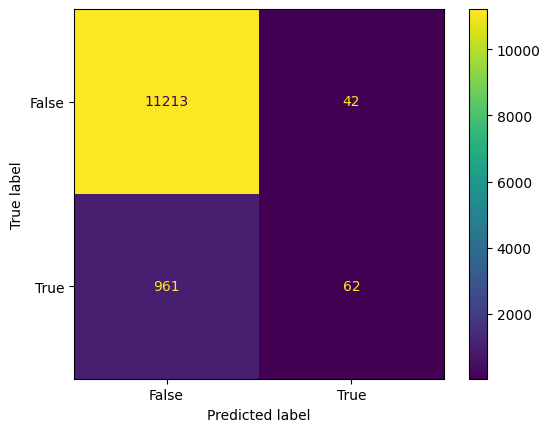

In [ ]:
#Logistic Regression model performance with Confusion Matrix
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
confusion_matrix_lr = confusion_matrix(y_test, lr_pred, labels= logreg.classes_)
ConfusionMatrixDisplay(confusion_matrix_lr, display_labels = logreg.classes_).plot()
print(classification_report(y_test,lr_pred))

In [ ]:
from sklearn.metrics import accuracy_score,precision_score,recall_score, f1_score,roc_auc_score,cohen_kappa_score,roc_curve
accuracy_lr = accuracy_score(y_test, lr_pred)
precision_lr = precision_score(y_test, lr_pred)
sensitivity_lr = recall_score(y_test, lr_pred)
f1_lr = f1_score(y_test, lr_pred)


result_lr = pd.DataFrame([['Log. reg.',accuracy_lr, precision_lr, sensitivity_lr,f1_lr]], columns=('model','accuracy','precision','sensitivity','f1'))
result_lr

,model,accuracy,precision,sensitivity,f1
0,Log. reg.,0.918309,0.596154,0.060606,0.110027


In [ ]:
lr_pred

array([False, False, False, ..., False, False, False])

In [ ]:
lr_pred_prob= logreg.predict_proba(X_test)

In [ ]:
%matplotlib inline
roc_auc_score(y_test,lr_pred_prob[:,1])

0.7302289891361416

In [ ]:
lr_roc_df = pd.DataFrame({'target': y_test , 'probas': lr_pred_prob[:,1]})
lr_roc_df

,target,probas
39244,False,0.049381
53130,False,0.071209
33405,False,0.101289
43061,False,0.064266
3780,False,0.060282
...,...,...
39031,False,0.077767
43643,False,0.028616
28858,False,0.109201
28230,False,0.076773


In [ ]:
lr_roc_df.sort_values(by='probas',inplace=True,ascending=False)
lr_roc_df.reset_index(inplace=True,drop=True)

for j in lr_roc_df.index:
  tp=0
  fp=0
  for i in range(j+1):
    if lr_roc_df.loc[i,'target'] =='True':
      tp += 1
    if lr_roc_df.loc[i,'target'] =='False':
      fp += 1
  lr_roc_df.loc[i,'tp'] = tp
  lr_roc_df.loc[i,'fp'] = fp




KeyboardInterrupt: ignored

In [ ]:
nb_neg,nb_pos =lr_roc_df['target'].value_counts
lr_roc_df['tpr'] = lr_roc_df['tp']/nb_pos
lr_roc_df['fpr'] = lr_roc_df['fp']/nb_neg

roc = lr_roc_df[['fpr','tpr']]
row_0 = pd.DataFrame({'fpr':[0],'tpr':[0]})
roc = pd.concat([row_0,roc])
roc.reset_index(inplace=True)

for i in range(1,len(roc)) :
    roc.loc[i,'area'] = (roc.loc[i,'fpr']-roc.loc[i-1,'fpr'])*(roc.loc[i,'tpr']+roc.loc[i-1,'tpr'])/2

AUC = roc['area'].sum()
AUC


In [ ]:
plt.plot(roc['fpr'], roc['tpr'])
# plt.xlim(-0.01,1.01)
# plt.ylim(-0.01,1.01)
plt.axline((0, 0), slope=1, color = 'red')
plt.text(0.6,0.4,f'AUC : {AUC:.3f}')
plt.xlabel('False positive')
plt.ylabel('True positive')
plt.show()

In [ ]:
#   SEGUNDO MODELO
fpr, tpr, thresholds = roc_curve(y_test, lr_pred)

In [ ]:
roc_auc = roc_auc_score(y_test, lr_pred_prob[:,1])
roc_auc

0.7302289891361416

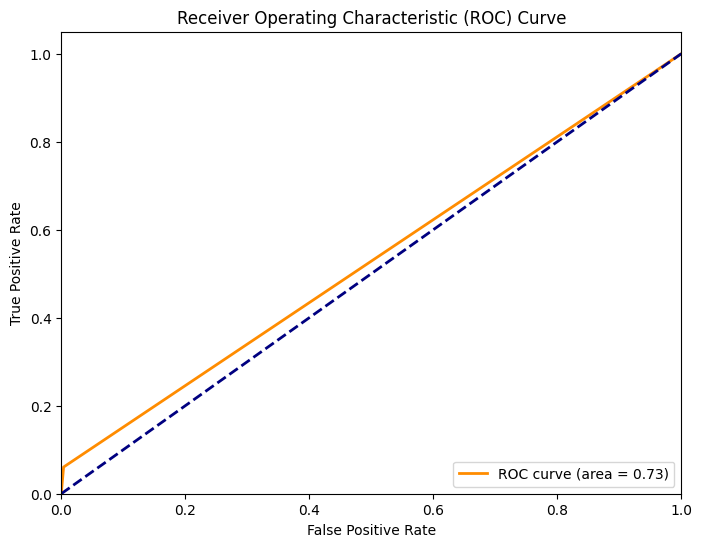

In [ ]:

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

+ Decision Tree

In [ ]:
#Classification Tree Model Fitting

from sklearn.tree import DecisionTreeClassifier
# Initializing Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf.fit(X_train,y_train)

#Predicting on the test set
clf_pred = clf.predict(X_test)

In [ ]:
#Calculating the model accuracy, how often is the classifier correct ?
from sklearn.metrics import accuracy_score

print("Accuracy Decision Tree Classifier: {:.2f}".format(accuracy_score(y_test, clf_pred)))


Accuracy Decision Tree Classifier: 0.87


              precision    recall  f1-score   support

       False       0.94      0.92      0.93     11255
        True       0.27      0.31      0.29      1023

    accuracy                           0.87     12278
   macro avg       0.60      0.62      0.61     12278
weighted avg       0.88      0.87      0.88     12278



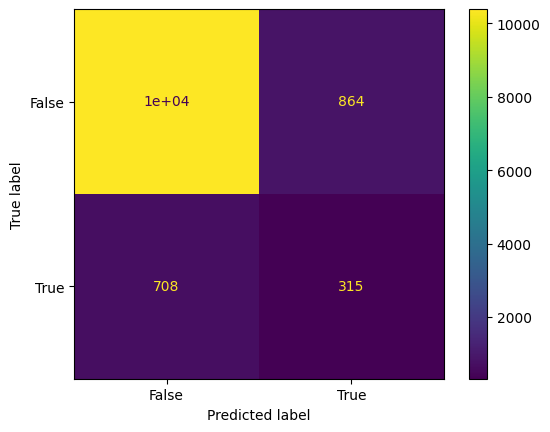

In [ ]:
#Classification Tree Model performance
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
confusion_matrix_clf = confusion_matrix(y_test, clf_pred, labels = clf.classes_)
ConfusionMatrixDisplay(confusion_matrix_clf, display_labels= clf.classes_).plot()
print(classification_report(y_test, clf_pred))

In [ ]:
from sklearn.tree import export_graphviz

export_graphviz(
 clf,
 out_file=("order_simple.dot"),
 feature_names=None,
 class_names=None,
 filled=True,
)

In [ ]:
!dot -Tpng hitters_simple.dot -o hitters_simple.png

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.245424 to fit


In [ ]:
from IPython.display import Image
Image("order_simple.png")

In [ ]:
accuracy_clf = accuracy_score(y_test, clf_pred)
precision_clf = precision_score(y_test, clf_pred)
sensitivity_clf = recall_score(y_test, clf_pred)
f1_clf = f1_score(y_test, clf_pred)


result_clf = pd.DataFrame([['decision tree',accuracy_clf, precision_clf, sensitivity_clf,f1_clf]], columns=('model','accuracy','precision','sensitivity','f1'))
result_clf

,model,accuracy,precision,sensitivity,f1
0,decision tree,0.871966,0.267176,0.307918,0.286104


+ Random Forest

In [ ]:
#Random Forest Model Fitting

from sklearn.ensemble import RandomForestClassifier
# Initializing Random Forest Classifer object
rf = RandomForestClassifier()

# Train Random Forest Classifer
rf.fit(X_train, y_train)

#Predicting on the test set
rf_pred = rf.predict(X_test)

In [ ]:
#Calculating Random Forest model accuracy
accuracy_rf = accuracy_score(y_test, rf_pred)
print("Accuracy Random Forest Classifier: {:.2f}".format(accuracy_rf))

Accuracy Random Forest Classifier: 0.93


              precision    recall  f1-score   support

       False       0.93      1.00      0.96     11255
        True       0.83      0.16      0.27      1023

    accuracy                           0.93     12278
   macro avg       0.88      0.58      0.62     12278
weighted avg       0.92      0.93      0.90     12278



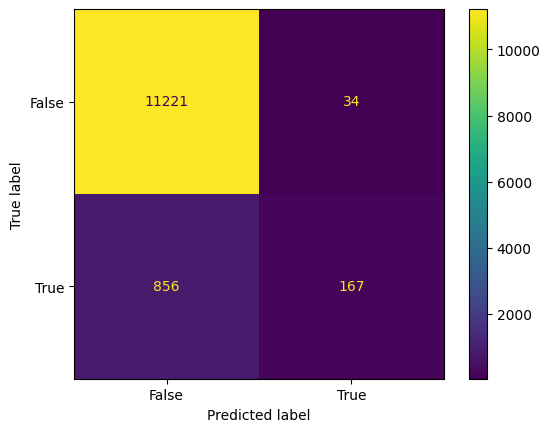

In [ ]:
#Random Forest Classifier model performance
confusion_matrix_rf = confusion_matrix(y_test, rf_pred, labels = rf.classes_)
ConfusionMatrixDisplay(confusion_matrix_rf, display_labels= rf.classes_).plot()
print(classification_report(y_test, rf_pred))

In [ ]:
accuracy_rf = accuracy_score(y_test, rf_pred)
precision_rf = precision_score(y_test, rf_pred)
sensitivity_rf = recall_score(y_test, rf_pred)
f1_rf = f1_score(y_test, rf_pred)


result_rf = pd.DataFrame([['random forest',accuracy_rf, precision_rf, sensitivity_rf,f1_rf]], columns=('model','accuracy','precision','sensitivity','f1'))
result_rf

,model,accuracy,precision,sensitivity,f1
0,random forest,0.928734,0.862745,0.172043,0.286879



After checking model performance accuracy (counts of correct classification) we can assume that our best model is Random Forest Classifier with 0.93% of correctly predicted predictions




In [ ]:
resultados = pd.concat([result_lr, result_clf,result_rf], axis=0)
resultados

,model,accuracy,precision,sensitivity,f1
0,Log. reg.,0.918309,0.596154,0.060606,0.110027
0,decision tree,0.871966,0.267176,0.307918,0.286104
0,random forest,0.928734,0.862745,0.172043,0.286879


Results:


> Metrics

+ Overall the accuracy between all the models seems to be high (between 86 and 92%) which meant that the models have been a great deal into predicting if the order was labeled as a good one or bad one.
+ Precision: However, for this exercise it is most interesting to predict only the bad orders, to which this metric is most important. As it can be revised, the random forest model is the one with the best result out of the three. Which means that of the total predicted true bad orders, the model have an 86% of good prediction

+ Sensitivity: However, all the models had a bad ratio in this metric. This metric indicates that the of all the True orders labeled as bad order, only ;in the best case; was predicted 30% of this cases. To make the model more fit, it will be used the methods for reduce the overfitting of the models.


# Tuning model

In [ ]:


estimators = list(range(2, 50, 5))
sens_rf_num_estimators = []
accu_rf_num_estimators = []

for n in estimators:
    rf = RandomForestClassifier(n_estimators=n, random_state=42)
    rf.fit(X_train, y_train)
    y_pred = rf.predict(X_test)
    sensitivity_rf = recall_score(y_test, rf_pred)
    accuracy_rf = accuracy_score(y_test, rf_pred)

    sens_rf_num_estimators.append(sensitivity_rf)
    accu_rf_num_estimators.append(accuracy_rf)


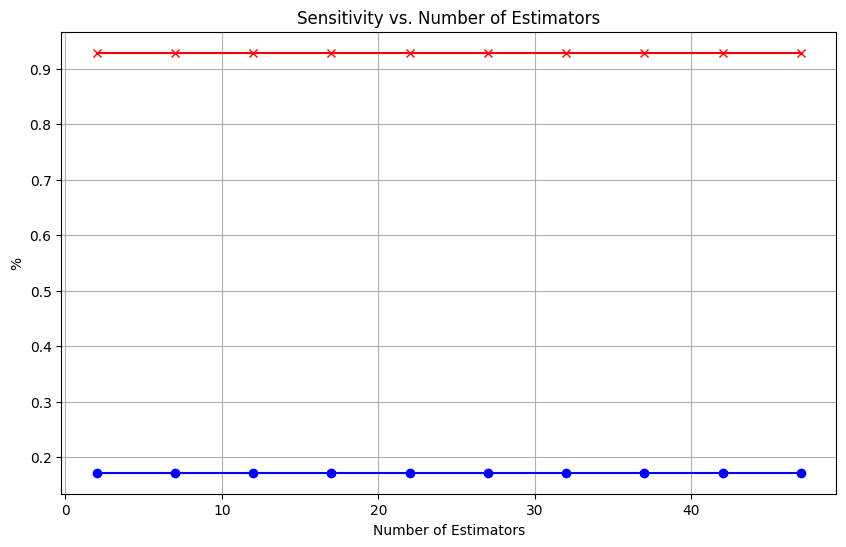

In [ ]:
# Plotting the results
plt.figure(figsize=(10, 6))
plt.plot(estimators, sens_rf_num_estimators, marker='o', linestyle='-', color='b')
plt.plot(estimators,accu_rf_num_estimators, marker='x', linestyle='-', color='r')
plt.title('Sensitivity vs. Number of Estimators')
plt.xlabel('Number of Estimators')
plt.ylabel('%')
plt.grid(True)
plt.show()

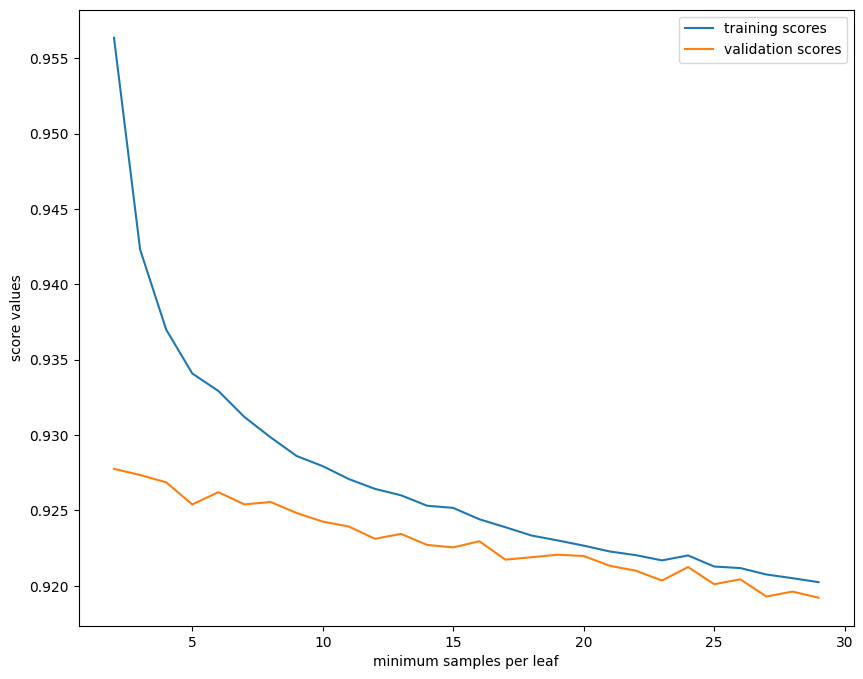

In [ ]:

train_scores = []
valid_scores = []
leaves = list(range(2,30))
for leaf in leaves :
    dtr = RandomForestClassifier(min_samples_leaf = leaf)
    dtr.fit(X_train, y_train)
    train_scores.append(dtr.score(X_train, y_train))
    valid_scores.append(dtr.score(X_test, y_test))

plt.figure(figsize=(10,8))
plt.plot(leaves, train_scores)
plt.plot(leaves, valid_scores)
plt.xlabel("minimum samples per leaf")
plt.ylabel("score values")
plt.legend(["training scores", "validation scores"])
plt.show()

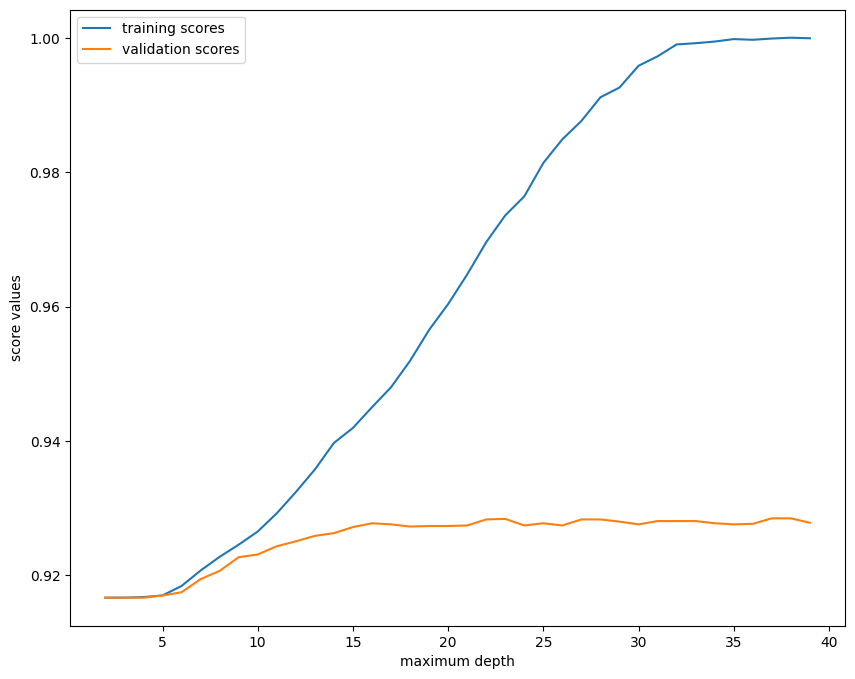

In [ ]:
train_scores = []
valid_scores = []
depths = list(range(2,40))
for depth in depths :
    dtr = RandomForestClassifier(max_depth = depth)
    dtr.fit(X_train, y_train)
    train_scores.append(dtr.score(X_train, y_train))
    valid_scores.append(dtr.score(X_test, y_test))

plt.figure(figsize=(10,8))
plt.plot(depths, train_scores)
plt.plot(depths, valid_scores)
plt.xlabel("maximum depth")
plt.ylabel("score values")
plt.legend(["training scores", "validation scores"])
plt.show()

+ GridSearchCV

In [ ]:
from sklearn.model_selection import GridSearchCV

params = {'max_depth': list(range(2, 15)), 'min_samples_leaf': list(range(2,20))}

grid_search_cv = GridSearchCV(RandomForestClassifier(),
                              params,
                              verbose=1,
                              cv=3,
                              n_jobs=-1)

grid_search_cv.fit(X_train, y_train)

Fitting 3 folds for each of 234 candidates, totalling 702 fits


GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,
                                       14],
                         'min_samples_leaf': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11,
                                              12, 13, 14, 15, 16, 17, 18, 19]},
             verbose=1)

In [ ]:

best_tree_model = grid_search_cv.best_estimator_
best_tree_model

RandomForestClassifier(max_depth=14, min_samples_leaf=2)

In [ ]:
best_tree_model.fit(X_train,y_train)
best_tree_model.score(X_test,y_test)

0.925395015474833

In [ ]:
rfo_pred = best_tree_model.predict(X_test)

In [ ]:
from sklearn.tree import export_graphviz
tree_to_visualize = best_tree_model.estimators_[0]

export_graphviz(
    tree_to_visualize,
    out_file=("optimal_tree.dot"),
    feature_names=None,  # Specify your feature names if needed
    class_names=None,    # Specify class names for classification tasks
    filled=True
)

In [ ]:
!dot -Tpng hitters_simple.dot -o hitters_simple.png
Image("optimal_tree.png")

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.245424 to fit


FileNotFoundError: ignored

FileNotFoundError: ignored

<IPython.core.display.Image object>

In [ ]:
accuracy_rfo = accuracy_score(y_test, rfo_pred)
precision_rfo = precision_score(y_test, rfo_pred)
sensitivity_rfo = recall_score(y_test, rfo_pred)
f1_rfo = f1_score(y_test, rfo_pred)


result_rfo = pd.DataFrame([['optimal random forest',accuracy_rfo, precision_rfo, sensitivity_rfo,f1_rfo]], columns=('model','accuracy','precision','sensitivity','f1'))
result_rfo

,model,accuracy,precision,sensitivity,f1
0,optimal random forest,0.925395,0.914729,0.115347,0.204861
